<hr>
<font size=5>
<div>


<b> Basic operations in OpenCV: </b>
</font>
<br>
<p>
<font size=4>
In this workshop, we plan to cover the following topics:
<ol>
  <li>Reading and displaying images</li>
  <li>Access and change pixel values</li>
  <li>Access image properties</li>
  <li>Adjust the desired area of ​​the image</li>
  <li>Splitting and merging image channels</li>
  <li>Arithmetic operations on images</li>
  <li>Basic operations in image processing</li>
  <li> Contrast and brightness</li>
</ol>
Note: In addition to OpenCV, <a href="https://numpy.org/doc/stable/">numpy</a> and
<a href="https://matplotlib.org/stable/users/index.html">matplotlib</a> libraries are used in this workshop.
</font>
</p>
<hr/>
</div>
</font>

<font>
<div>

<font size=5>
<b> Load required libraries and helper functions</b>
</font>

</div>
</font>

In [1]:
import cv2
import math
import requests # For reading image from URL
import numpy as np
import matplotlib.pylab as plt
from google.colab.patches import cv2_imshow # For displaying image in Google Colab

def read_image_from_url(url):
    # Fetch the content from the url
    response = requests.get(url)
    # Check if the request was successful
    response.raise_for_status()
    # Convert the response content to a numpy array and then to a OpenCV BGR image
    image = cv2.imdecode(np.asarray(bytearray(response.content), dtype="uint8"), cv2.IMREAD_COLOR)
    return image

## 1. Reading and displaying images
#### At this point
 #### We are going to read images from different URLs and then display them.
####  Note 1: Pay attention to the differences between BGR and RGB when reading images. In OpenCV, the input channels for reading images are BGR by default. For example, in the images below, the image on the right, which is in RGB format, and when OpenCV is given to read this image, the image is not displayed correctly.
####  Note 2: Due to the use of Google Colab and the URL of the images, it is not possible to use the code below to read and display the image, but you can try these commands in your editor.

### Image reading:

#### cv2.imread("image location", a flag which specifies the way image should be read.) flags:
#### cv2.IMREAD_COLOR: Loads a color image. Any transparency of image will be neglected. It is the default flag.
#### cv2.IMREAD_GRAYSCALE: Loads image in grayscale mode
#### cv2.IMREAD_UNCHANGED: Loads image as such including alpha channel

### Showing Picture:


#### cv2.imshow("window name", our image variable)
#### cv2.waitKey(0) # The function waits for specified milliseconds for any keyboard event. If 0 is passed, it waits indefinitely for a key stroke.
#### cv2.destroyAllWindows() # Simply destroys all the windows we created.








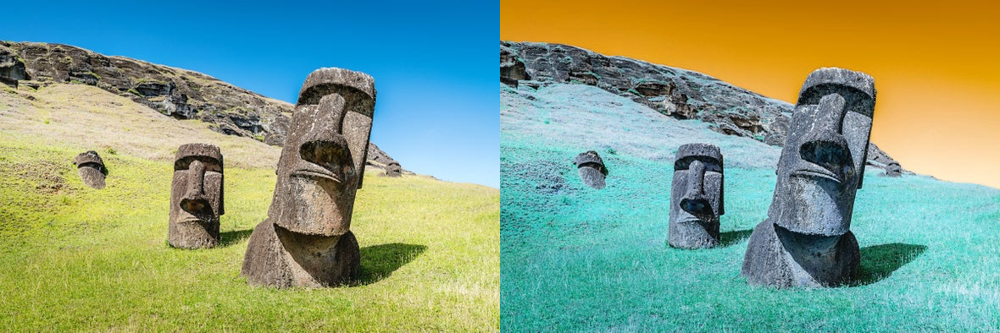

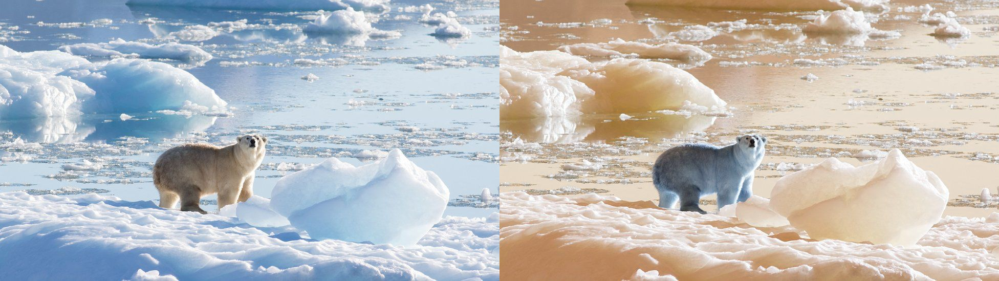

In [ ]:
# Create a list to store the urls of the images
urls = ["https://static.scientificamerican.com/sciam/cache/file/DB4E849F-5267-4A4C-A8A1F8AB1344C945_source.jpg?w=590&h=800&8397FFEE-1F26-49BC-98ECB53FE3F8A6D6",
        "https://ichef.bbci.co.uk/news/976/cpsprodpb/14591/production/_125454338_11d9fae1beaf4ea3afbe3986a43bea758df8a8e5.jpg"]

for url in urls:
  image = read_image_from_url(url) # Read the image from URL using OpenCV + requests
  image_2 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Convert from BGR to RGB channel
  final_frame = cv2.hconcat((image, image_2)) # Concatenate the BGR image to RGB image
  cv2_imshow(final_frame) # Display the image
  print('\n')

## Exercise 1:
#### Now that you are familiar with how to read and display images, copy the address of an image and display it in both RGB and BGR formats.

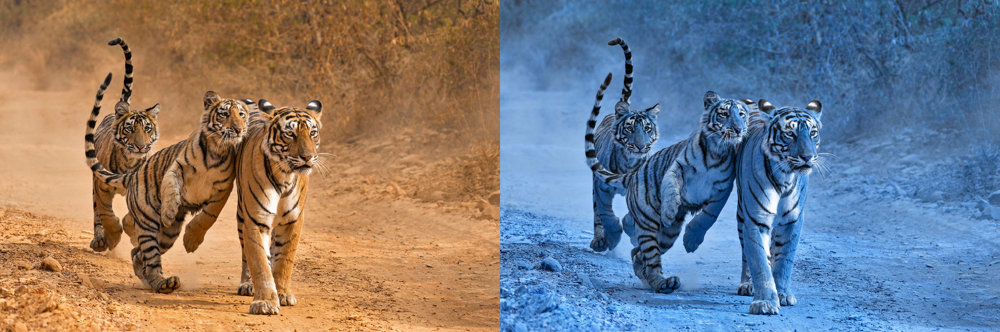

In [ ]:
## TODO1: Read and Display an image
url = "https://static.scientificamerican.com/sciam/assets/Image/2023/GettyImages-533217219_web.jpg"
myImg1 = read_image_from_url(url)
### START
#cv2_imshow(myImg1) # BGR image output
#print('/n')
myImg2 = cv2.cvtColor(myImg1, cv2.COLOR_BGR2RGB)
final_frame = cv2.hconcat((myImg1, myImg2))
# Convert to RGB
cv2_imshow(final_frame) # RGB image output
### END

## 2. Access and change pixel values
#### You can access the value of a pixel using its row and column coordinates. For BGR image, returns an array of blue, green, red values. For a grayscale image, only the corresponding intensity is returned.
<div style="display: flex; justify-content: center;">
  <img src="https://static.packt-cdn.com/products/9781789344912/graphics/assets/ef884cf4-46f9-4db1-b473-ed80ecbc2593.png" alt="Image 1" width="400">
  <img src="https://static.packt-cdn.com/products/9781789344912/graphics/assets/a4bb6560-4c40-4de2-b88f-8e08b69cf7ab.png" alt="Image 2" width="400">
</div>

In [ ]:
url = "https://static.scientificamerican.com/sciam/cache/file/DB4E849F-5267-4A4C-A8A1F8AB1344C945_source.jpg?w=590&h=800&8397FFEE-1F26-49BC-98ECB53FE3F8A6D6"
img = read_image_from_url(url)

px = img[100,100]
print("Pixel(100,100)(Blue, Green, Red):",px)

# accessing only blue pixel
blue = img[100,100,0]
print("Blue:", blue)

Pixel(100,100)(Blue, Green, Red): [157 193 201]
Blue: 157


#### Also we can change the values ​​of a pixel. But accessing each of the pixel values ​​and changing it is a very slow process and is mentioned here only to understand the concepts.

In [ ]:
print("‌‌Bfore editing pixel:", px)
px = [0, 0, 0]
print("After editing pixel:", px)

‌‌Bfore editing pixel: [157 193 201]
After editing pixel: [0, 0, 0]


## 3. Access image properties
#### Image characteristics include the number of rows, columns, channels, image data type, number of pixels, etc. If the image is colored, the <code> shape</code> command gives us a tuple of the number of rows and columns and the number of image channels. And if the image is grayscale, it outputs a tuple of the number of rows and columns.

In [ ]:
print("Image shape(#row, #column, #channel):", img.shape)

Image shape(#row, #column, #channel): (394, 590, 3)


#### To find out the number of pixels in an image, we use the <code> size</code> command.

In [ ]:
print("# Pixels:", img.size)

# Pixels: 697380


#### To find out the data type of an image, we use the <code>dtype</code> command.

In [ ]:
print("Image datatype:",img.dtype)

Image datatype: uint8


## 4. Adjust the desired area of ​​the image
#### Sometimes, you have to play with certain areas of the images. To detect eyes in images, first face detection is done in the whole image. When a face is obtained, we select the face region alone and instead of searching the whole image, we search for the eyes within it. Because it improves accuracy (because the eyes are always on the face) and increases speed (because we search in a small area). For example, consider the following figure:

#### Note: The input channels in matplotlib are RGB, so to display images with matplotlib that are read using OpenCV, we must first convert the image to RGB and then display it with matplotlib.

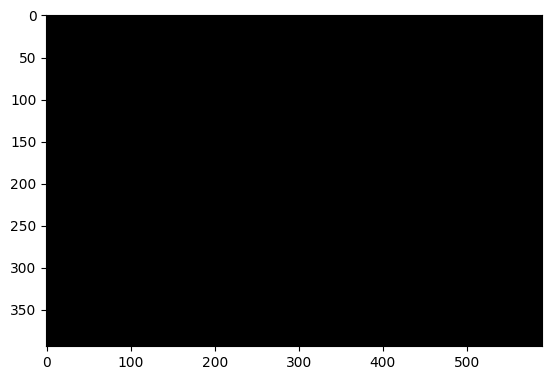

In [ ]:
new_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert the image to RGB
plt.imshow(new_img)

#### Now we want to create a copy of one of the statues in the image.

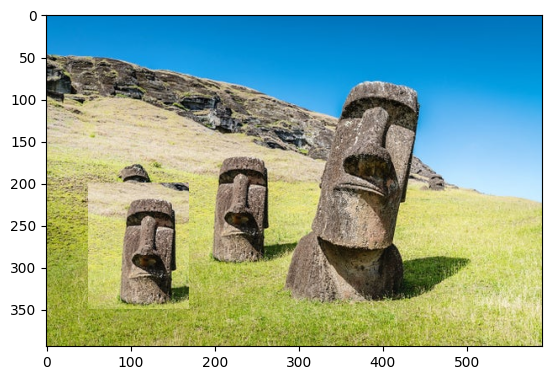

In [ ]:
statue = new_img[150:300, 160:280]
new_img[200:350, 50:170] = statue
plt.imshow(new_img)

## Exercise 2:
#### Copy the ball in the image in an area as desired and display it at the end.

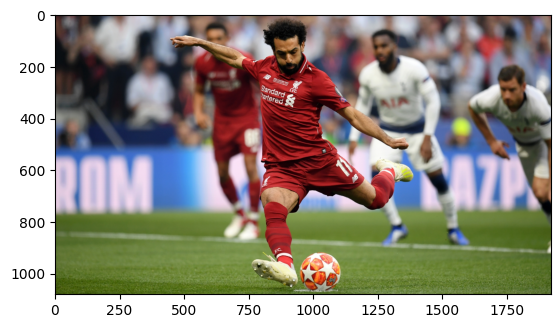

In [ ]:
url = "https://www.soccer-training-methods.com/images/salahkicking.jpg"
test_img = read_image_from_url(url)
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
plt.imshow(test_img)

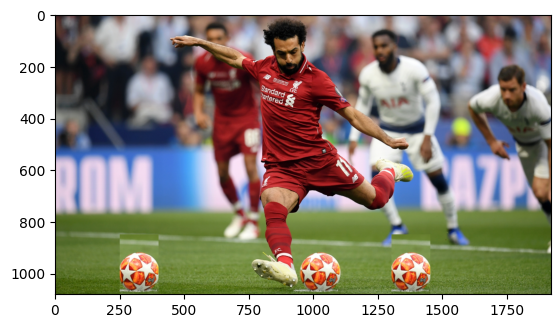

In [ ]:
## TODO2: Image ROI
ball = test_img[850:1150, 950:1100]
test_img[850:1150, 1300:1450] = ball
plt.imshow(test_img)

## 5. Splitting and merging image channels
#### Sometimes it is necessary to work separately on the B, G, R channels of an image. In this case, you need to split the BGR image into separate channels. In other cases, you may need to combine these channels to create a BGR image.
#### As you can see, we have separated the image channels and displayed the blue channel image. Pay attention that the grayscaled image shows us the intensity of the blue color. To understand more, you can output the red image (r) and see what changes are made in the image.

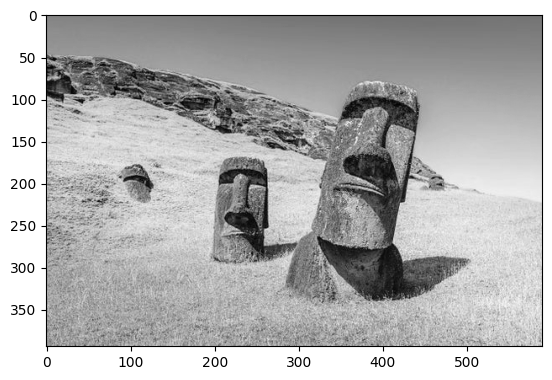

In [ ]:
# split channels
b,g,r=cv2.split(img)
# show one of the channels (this is blue - see that the sky is kind of dark. try changing it to r)
plt.imshow(g, cmap='gray')

## Exercise 3
#### Given an image that contains red, green, and blue channels, how can you display only the blue channel as true blue, while ensuring that the green and red channels do not contribute to the final display? Please write your code in the cell below and show the output.

##### Tip: To emphasize blue, you'll want to make sure the green and red channels are set to zero.

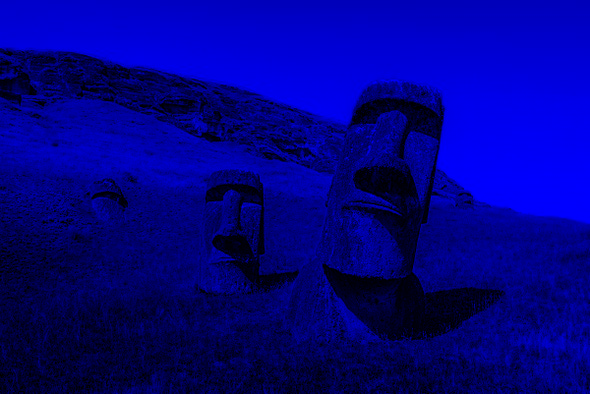

In [ ]:
# split channels
#b,g,r=cv2.split(img)

#g[:] = 0
#r[:] = 0

#result = cv2.merge((b, g, r))

img[:,:, 1] = 0
img[:,:, 2] = 0
cv2_imshow(img)

## 6. Arithmetic operations on images
#### OpenCV has many functions for doing math on images. Some of these functions have "equivalents" in Numpy, but it's almost always better to use the OpenCV version. This is because OpenCV is designed to work on images and therefore handles Overflow better. In the following, we will mention some of these functions.

## Add images to each other:

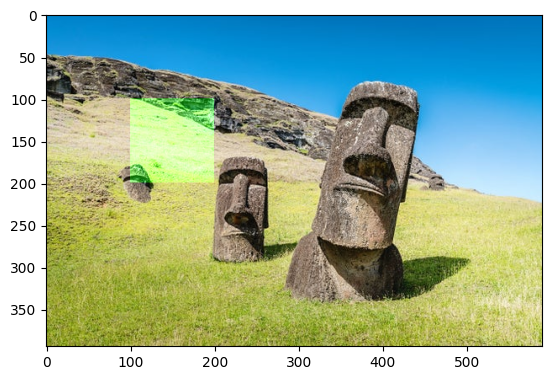

In [ ]:
## Adding two images with the same size to each other:
blank_image = np.zeros((img.shape), np.uint8)
blank_image[100:200,100:200,1] = 100 # make a green square in the blank image
# plt.imshow(blank_image) # if you want to check the blank_image first uncomment this line and comment the last line.
new_image=cv2.add(blank_image,img) # add function which adds two images to each other.
plt.imshow(cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB))

#### It is also possible to add weighted images, that is: $$Result = α · img1 + β · img2 + γ$$

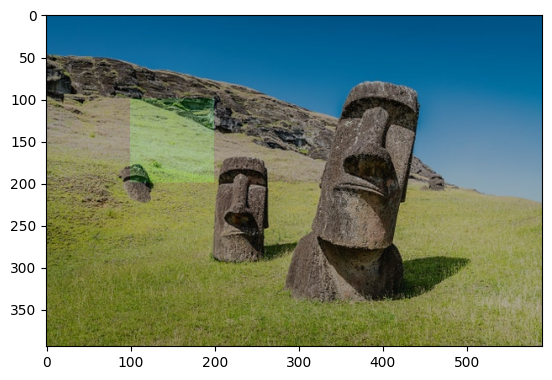

In [ ]:
result = cv2.addWeighted(img, 0.7, blank_image, 0.3, 0) # change the numbers
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))

## Exercise 4
#### Combine the two images below in the desired ratio.

##### Note: The size of the two images must be the same.

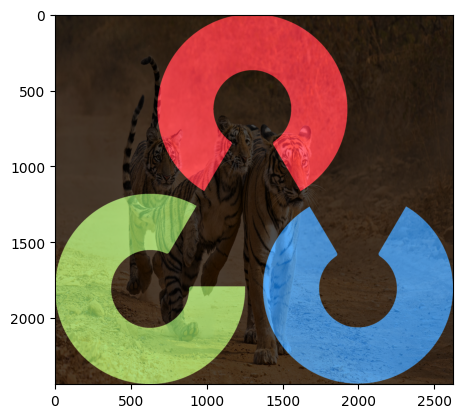

In [ ]:
## TODO4
url1 = "https://github.com/opencv/opencv/wiki/logo/OpenCV_logo_no_text.png"
img1 = read_image_from_url(url1)
#img2 = np.zeros((img1.shape), np.uint8)

url2 = "https://static.scientificamerican.com/sciam/assets/Image/2023/GettyImages-533217219_web.jpg"
img2 = read_image_from_url(url2)

img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))

alpha = 0.7
beta = 0.3

result = cv2.addWeighted(img1, alpha, img2, beta, 0)

plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.show()

## Bitwise Operations
#### It includes bit operations AND, OR, NOT and XOR. They will be very useful when extracting any part of the image that is non-rectangular. Below is an example of how to change a specific area of ​​an image.

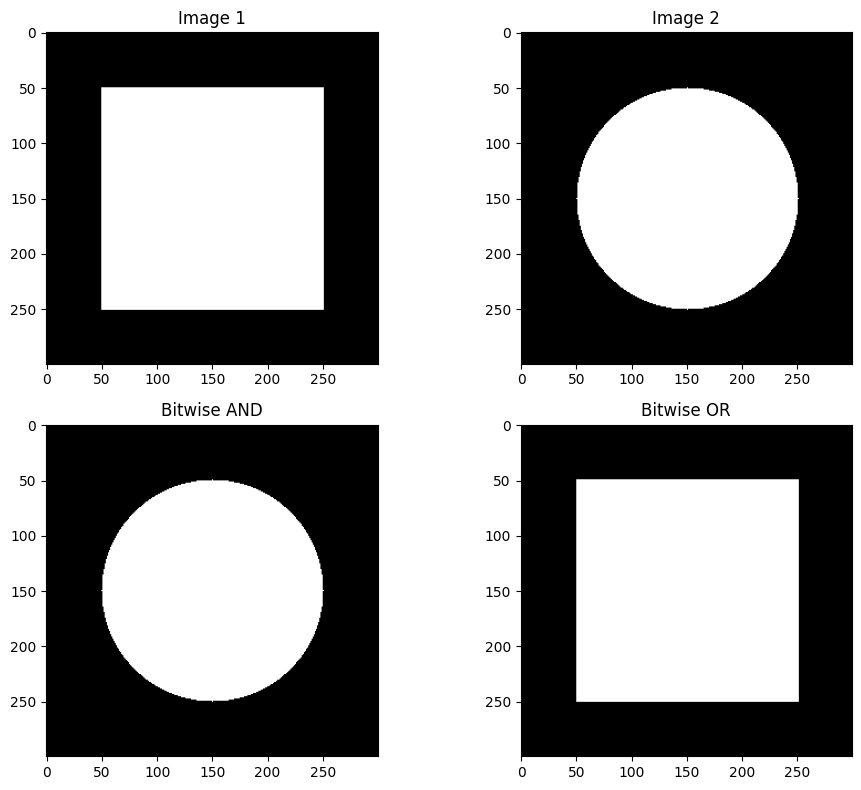

In [ ]:
img1 = np.zeros((300, 300), dtype=np.uint8)
img2 = np.zeros((300, 300), dtype=np.uint8)

# Draw a white rectangle on img1
cv2.rectangle(img1, (50, 50), (250, 250), 255, -1)

# Draw a white circle on img2
cv2.circle(img2, (150, 150), 100, 255, -1)

# Bitwise AND operation
bitwise_and = cv2.bitwise_and(img1, img2)

# Bitwise OR operation
bitwise_or = cv2.bitwise_or(img1, img2)

plt.figure(figsize=(10, 8))
plt.subplot(221), plt.imshow(img1, 'gray'), plt.title('Image 1')
plt.subplot(222), plt.imshow(img2, 'gray'), plt.title('Image 2')
plt.subplot(223), plt.imshow(bitwise_and, 'gray'), plt.title('Bitwise AND')
plt.subplot(224), plt.imshow(bitwise_or, 'gray'), plt.title('Bitwise OR')

plt.tight_layout()
plt.show()


## 7. Basic operations in image processing
#### Now that you are familiar with the basic operations in OpenCV, we are going to get to know a little bit about the basic operations in image processing.

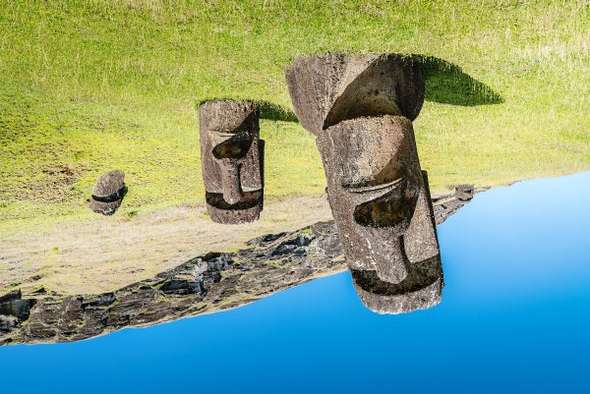

In [ ]:
flipped_code_0 = cv2.flip(img,0) # vertical flip
cv2_imshow(flipped_code_0)

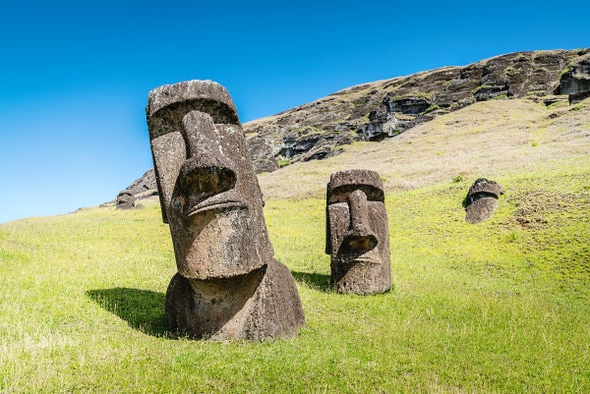

In [ ]:
flipped_code_1 = cv2.flip(img,1) # horizontal flip
cv2_imshow(flipped_code_1)

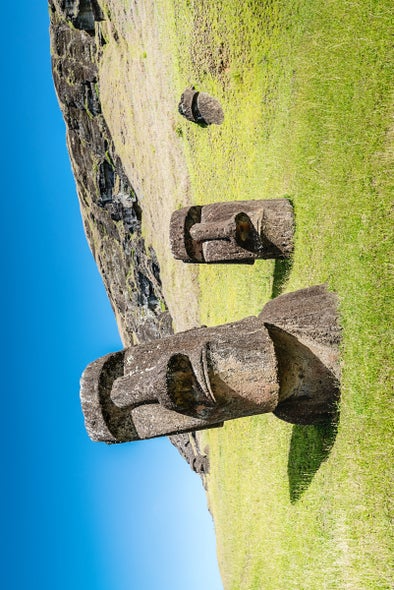

In [ ]:
transposed = cv2.transpose(img)
cv2_imshow(transposed)

## Exercise 5
#### Implement a function that rotates an image by a given angle without using OpenCV's rotate function and without having to deal with interpolation or cropping or border resizing:
#### 1. The function should receive an image and an angle (in degrees) as input.
#### 2. The function should return the rotated image.
#### 3. The rotation is done in the center of the image.
#### 4. Because you do not use interpolation in this implementation, you may see black dots in the acquired image.
#### Tips:  
#### 1. A point (x,y) can be rotated around the origin (0,0) by an angle θ using the following equations: $$x' = x \cos(\theta) - y \sin(\theta)$$ $$y' = x \sin(\theta) + y \cos(\theta)$$ To rotate around the center of the image, first move the image so that its center is at the origin, then apply the rotation and finally return it to the original location. Note that the angle must be converted to radians.

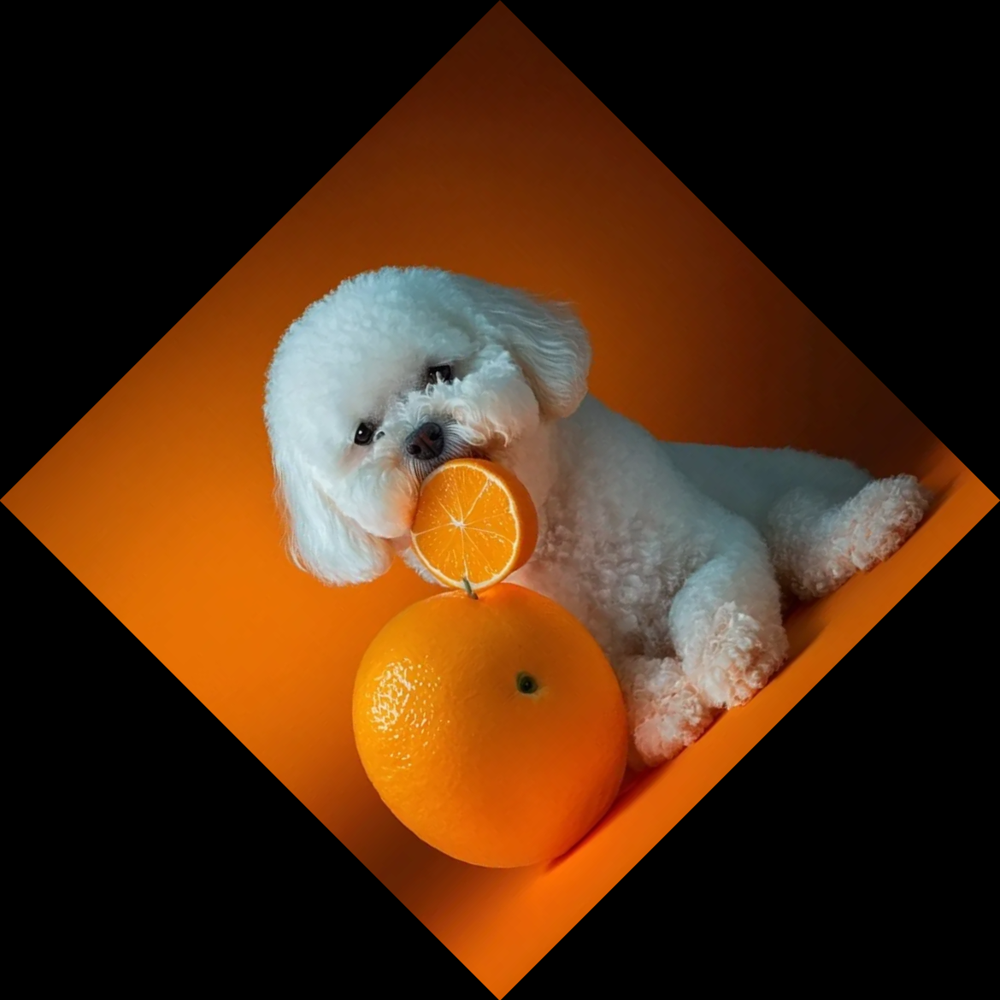

In [ ]:

def rotate_image(img, angle):
  ### START
    imgHeight, imgWidth = img.shape[0], img.shape[1]
    centreY, centreX = imgHeight//2, imgWidth//2

    # Computing 2D rotation Matrix to rotate an image
    rotationMatrix = cv2.getRotationMatrix2D((centreY, centreX), angle, 1.0)
    cosofRotationMatrix = np.abs(rotationMatrix[0][0])
    sinofRotationMatrix = np.abs(rotationMatrix[0][1])

    # warpAffine function for image sides cropping
    newImageHeight = int((imgHeight * sinofRotationMatrix) + (imgWidth * cosofRotationMatrix))
    newImageWidth = int((imgHeight * cosofRotationMatrix) + (imgWidth * sinofRotationMatrix))

    rotationMatrix[0][2] += (newImageWidth/2) - centreX
    rotationMatrix[1][2] += (newImageHeight/2) - centreY

    rotatingimage = cv2.warpAffine(img, rotationMatrix, (newImageWidth, newImageHeight))

    return rotatingimage
  ### END

test_url5 = "https://miro.medium.com/v2/resize:fit:828/format:webp/1*YMJDp-kqus7i-ktWtksNjg.jpeg"
test_img5 = read_image_from_url(test_url5)
rotated_img = rotate_image(test_img5, 45)
cv2_imshow(rotated_img)

## 8. Contrast and brightness
#### Contrast - controls the difference between light and dark areas of the image. Higher contrast makes bright areas brighter and dark areas darker. Lower contrast makes the intensity of the pixels closer to the middle limit and the image looks flatter and dimmer.

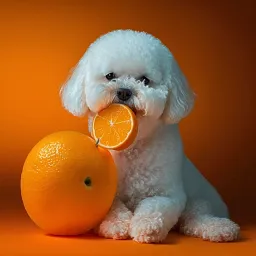

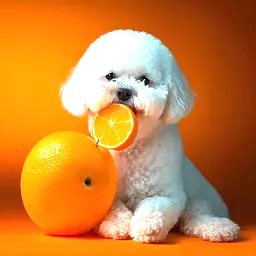

In [ ]:
test_url5 = "https://miro.medium.com/v2/resize:fit:256/format:webp/1*YMJDp-kqus7i-ktWtksNjg.jpeg"
test_img5 = read_image_from_url(test_url5)
contrast = 1.5 # increase contrast
adjusted = cv2.addWeighted(test_img5, contrast, 0, 0, 0)
cv2_imshow(test_img5)
cv2_imshow(adjusted)

### Brightness
#### Controls the overall brightness or intensity of the pixels. Higher brightness makes the image appear lighter or "washed out". Lower brightness makes the image appear darker. Brightness is adjusted by adding or subtracting a value to the pixel intensity. In OpenCV this is done by adding a brightness factor to a zero matrix.

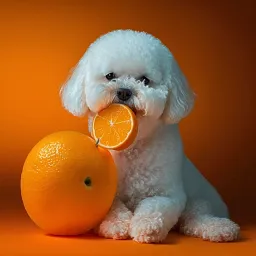

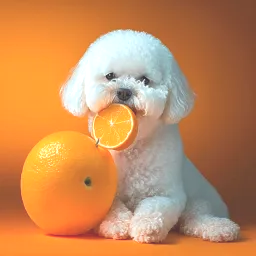

In [ ]:
test_img5 = read_image_from_url(test_url5)
brightness = 50 # increase brightness
brightened = cv2.addWeighted(test_img5, 1, np.zeros(test_img5.shape, dtype=test_img5.dtype), 0, brightness)
cv2_imshow(test_img5)
cv2_imshow(brightened)

## Exercise 6:
#### The picture below was taken by the traffic police at night. Using the concepts of contrast and brightness, obtain an image that can be recognized by the human eye.

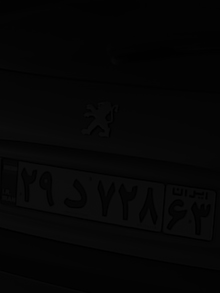

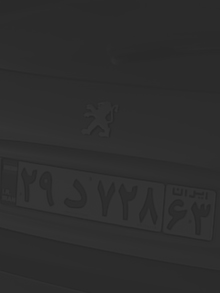

In [ ]:
low_contrast_image = read_image_from_url("https://i.ibb.co/Brcmbyt/plate-night.png")
cv2_imshow(low_contrast_image)

brightness = 40

# Create a mask for brightness adjustment (an all-black image with the same dimensions)
mask = np.zeros(low_contrast_image.shape, dtype=low_contrast_image.dtype)

brightened = cv2.addWeighted(low_contrast_image, 1, mask, 0, brightness)

cv2_imshow(brightened)

##### All rights belong to Dr. Mostafa Shamsi and Kiarash Moktari